In [1]:
%matplotlib inline
import re
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import nibabel as nib
from glob import glob
from os.path import join, basename, splitext
from nilearn.masking import apply_mask
from nilearn.image import resample_to_img

In [2]:
data_dir = '/scratch/PSB6351_2017/students/salo/data/'
surf_dir = '/scratch/PSB6351_2017/ds008_R2.0.0/surfaces/'
out_dir = '/scratch/PSB6351_2017/students/salo/week07/plots/'
slice_dir = join(out_dir, 'smoothing')
ts_dir = join(out_dir, 'timeseries')

kernels = range(3, 13, 3)
sm_tools = ['afni', 'fsl', 'susan']
bp_tools = ['afni', 'fsl', 'nipype']
regions = {'cort1': 1002,
           'cort2': 1018,
           'cort3': 1024,
           'subcort1': 17,
           'subcort2': 11}

sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = [12, 8]

sub-01
sub-02
sub-03
sub-04
sub-05
sub-06
sub-07


/home/data/nbc/ns-vs-bm/ns-vs-bm/env/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


sub-09
sub-10
sub-11
sub-12
sub-13
sub-14
sub-15


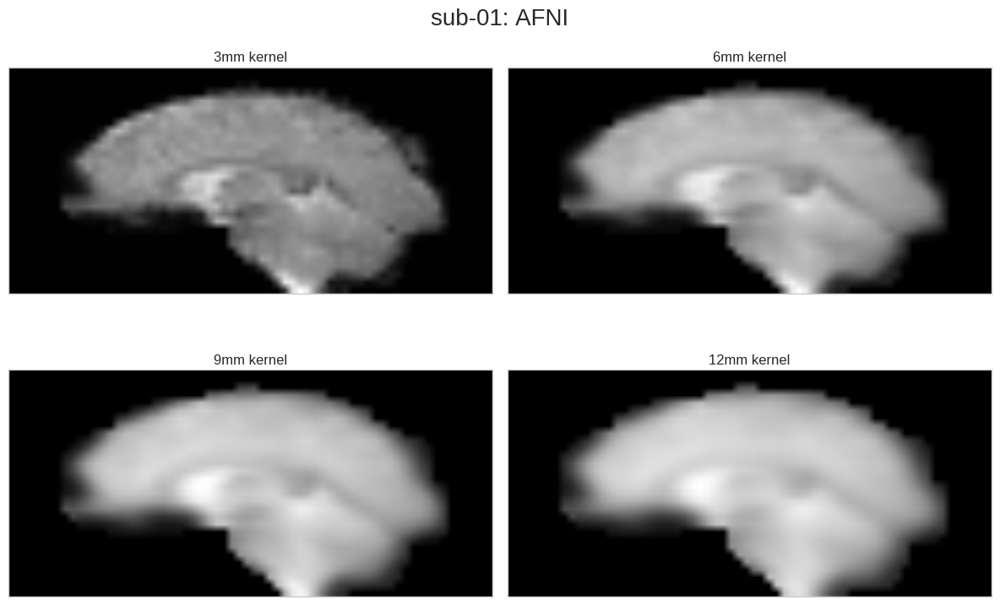

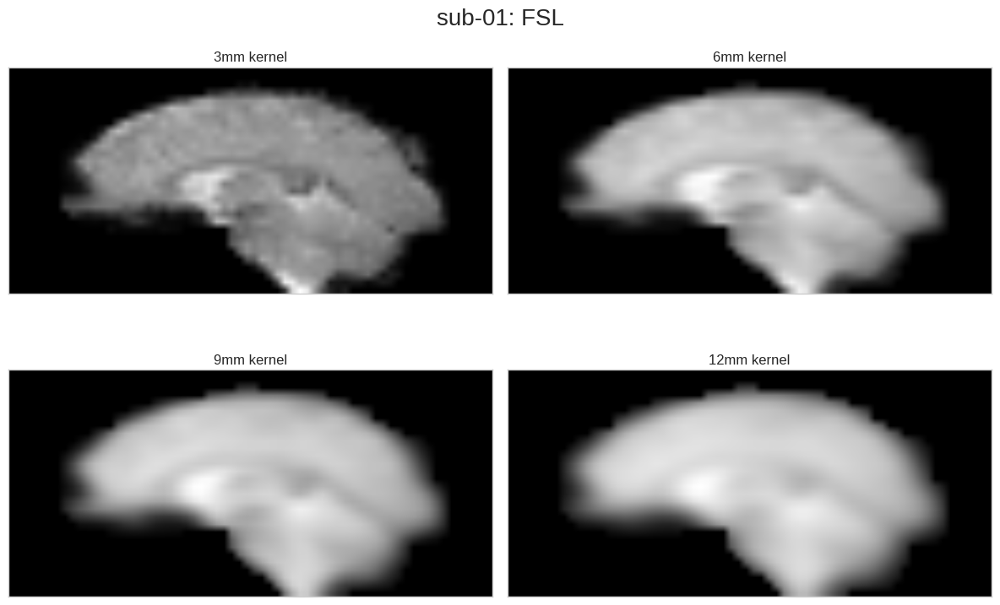

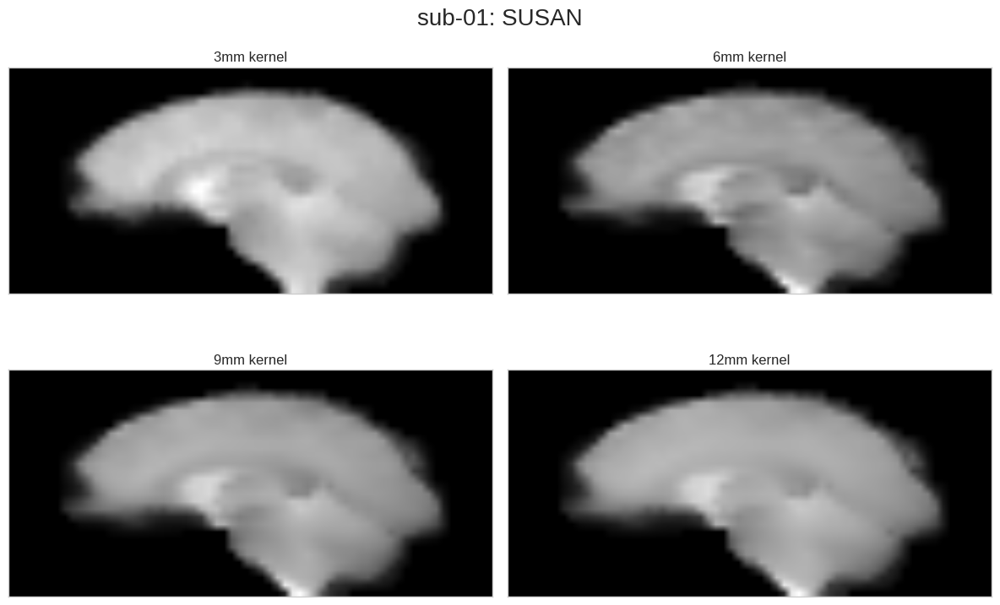

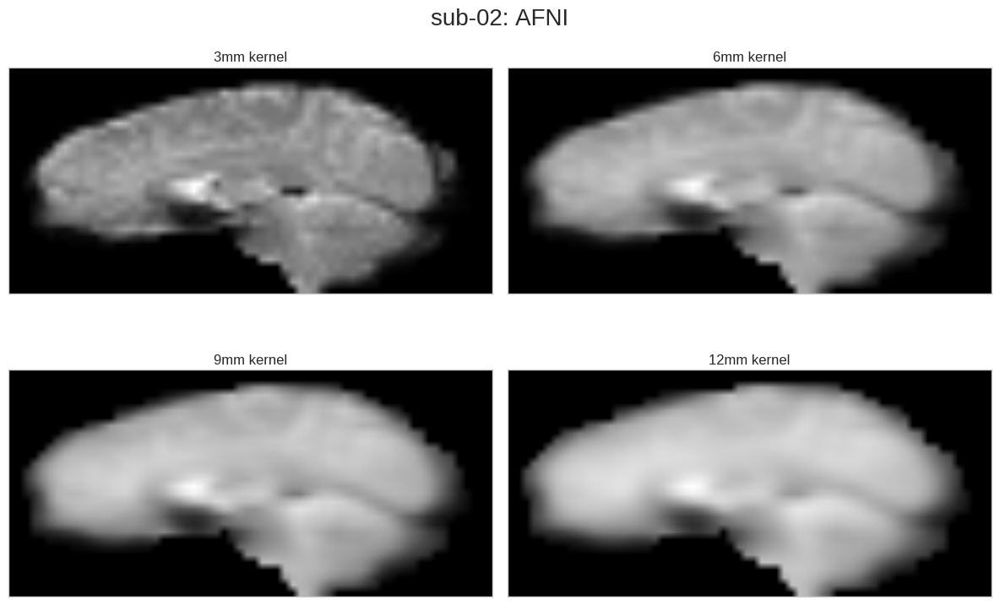

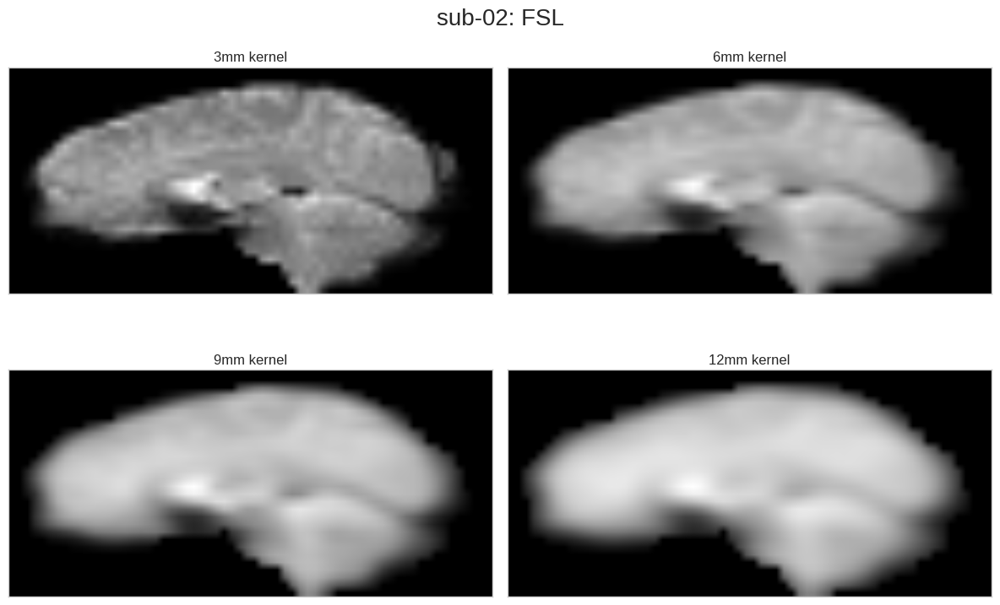

...

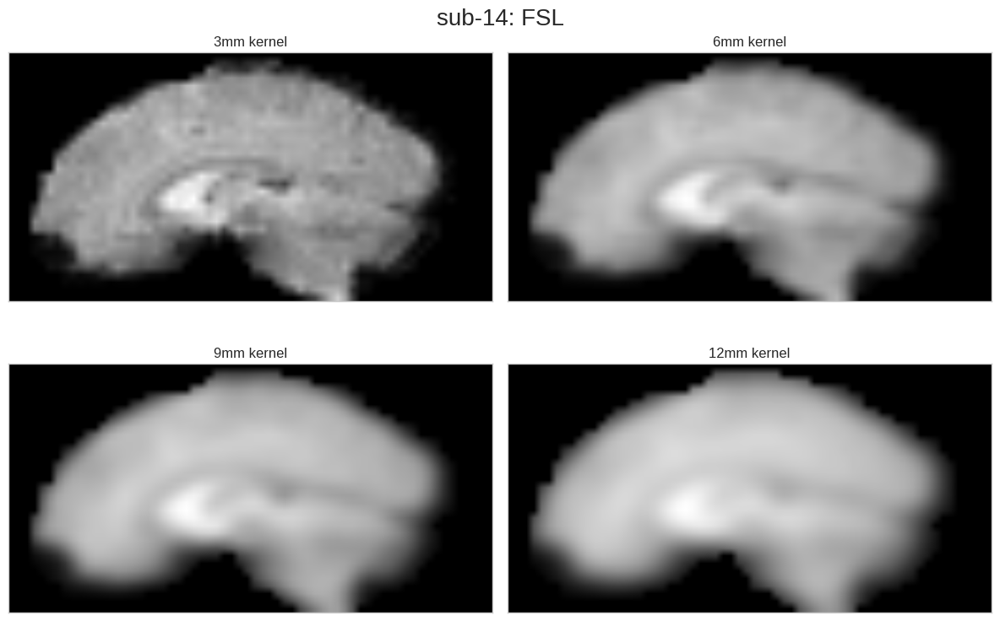

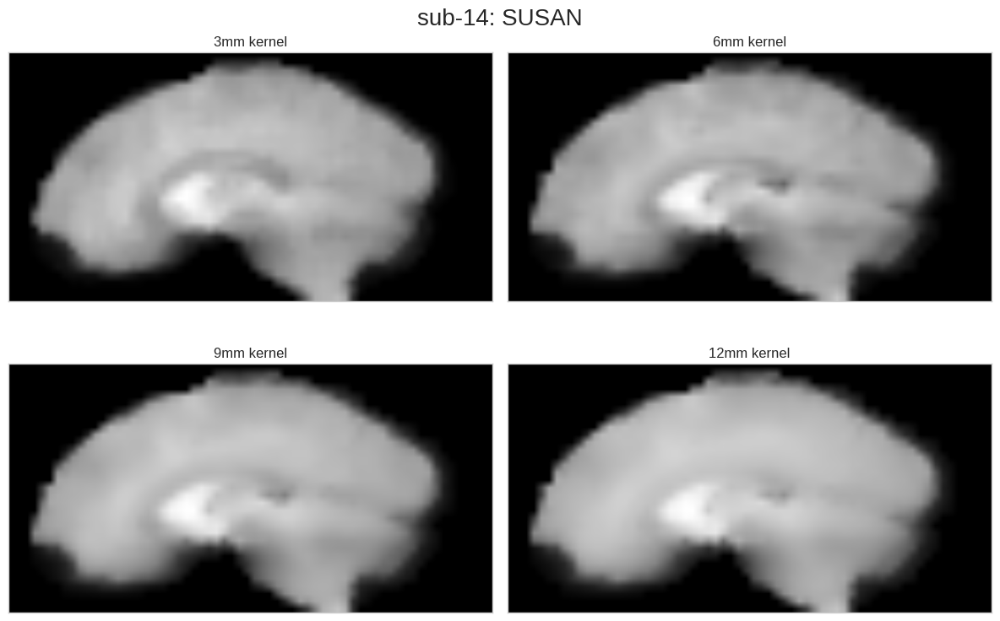

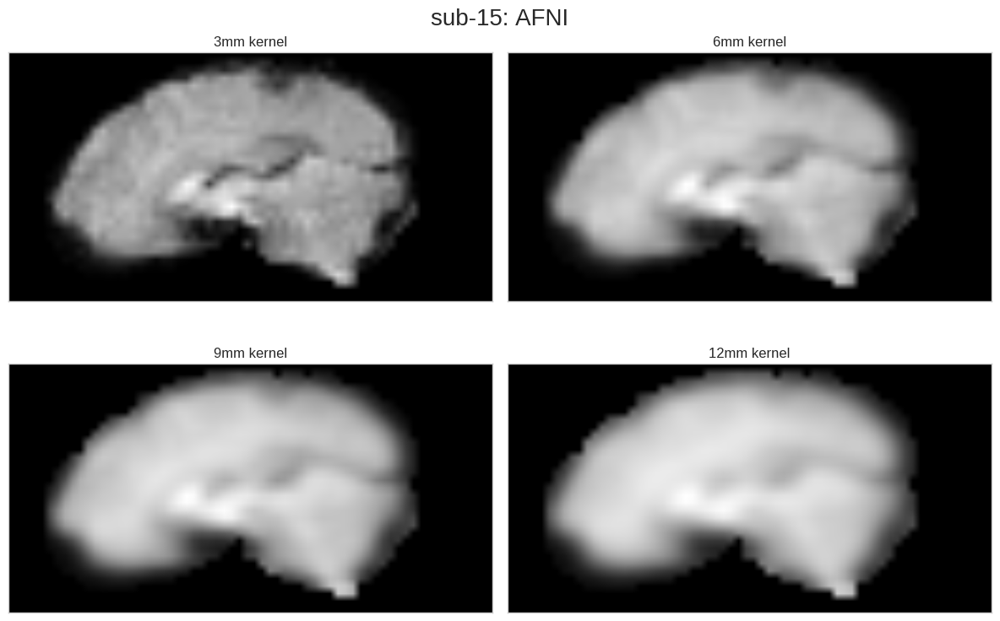

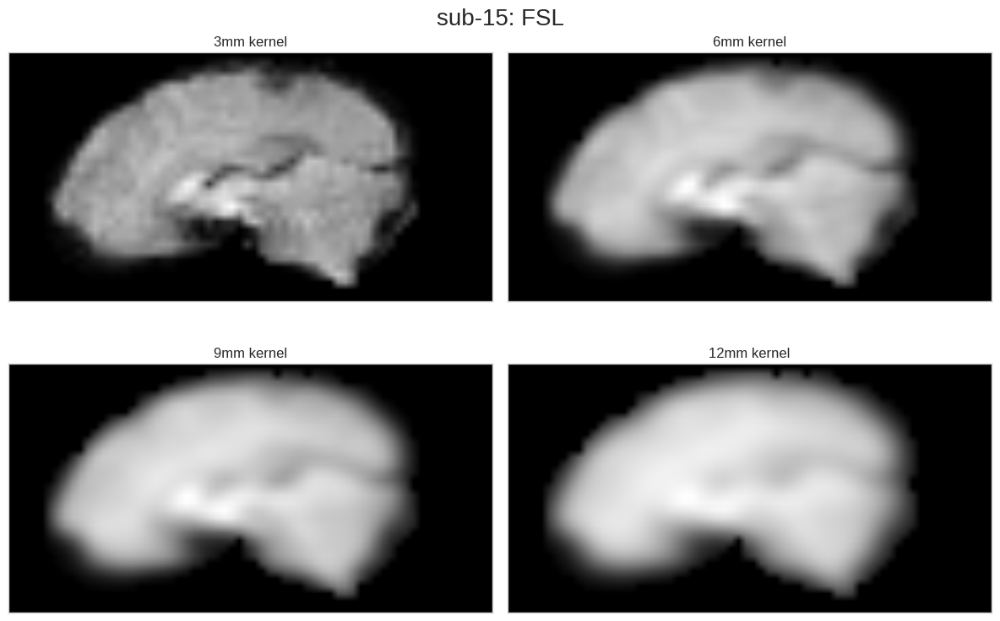

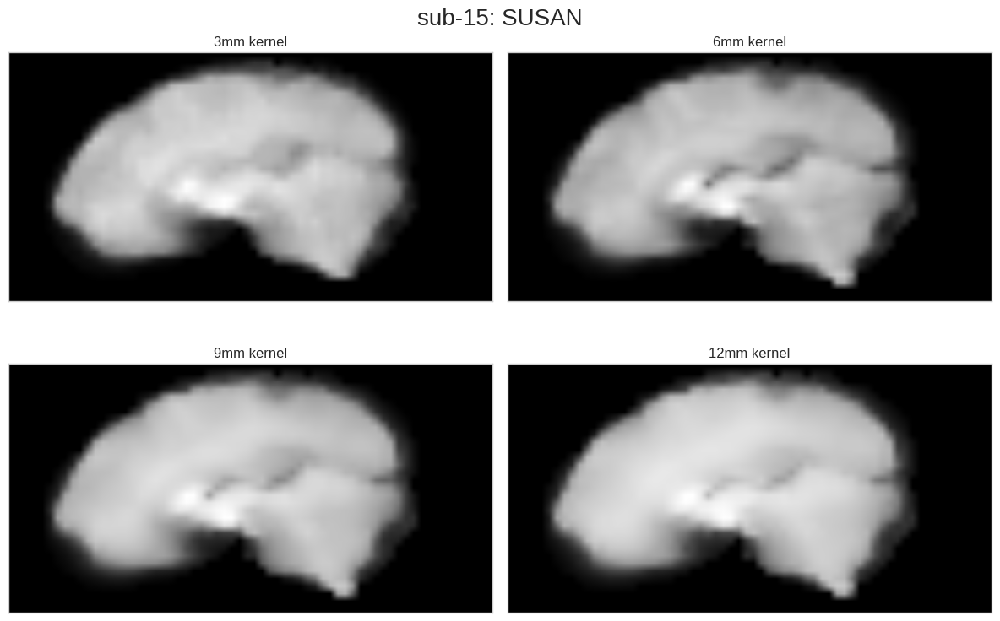

In [3]:
subjects = sorted([basename(f) for f in glob(join(data_dir, 'sub-*'))])
for s in subjects:
    print(s)
    sm_dir = join(data_dir, s, 'preproc/func/smoothed/')
    images = [plt.subplots(2, 2) for _ in range(len(sm_tools))]
    figs, axes = zip(*images)
    
    for i, k in enumerate(kernels):
        if i > 1:
            row, col = 1, i-2
        else:
            row, col = 0, i
        
        for j, sm in enumerate(sm_tools):            
            sub_dir = '{0}_sm{1}'.format(sm, k)
            sm_files = sorted([basename(f) for f in glob(join(sm_dir, sub_dir, '*.nii.gz'))])
            f = join(sm_dir, sub_dir, sm_files[0])
            f_dat = nib.load(f).get_data()
            
            # Plot slices
            axes[j][row, col].imshow(np.rot90(f_dat[32, :, :, 50], k=3), cmap='gray', origin='lower')
            axes[j][row, col].set_title('{0}mm kernel'.format(k))
            axes[j][row, col].set_xticks([])
            axes[j][row, col].set_yticks([])
            
            if k == kernels[-1]:
                figs[j].suptitle('{0}: {1}'.format(s, sm.upper()), fontsize=20)
                figs[j].tight_layout()
                figs[j].savefig(join(slice_dir, '{0}_{1}.png'.format(s, sm)), dpi=100)

sub-01
sub-02
sub-03
sub-04
sub-05
sub-06
sub-07
sub-09
sub-10
sub-11
sub-12
sub-13
sub-14
sub-15


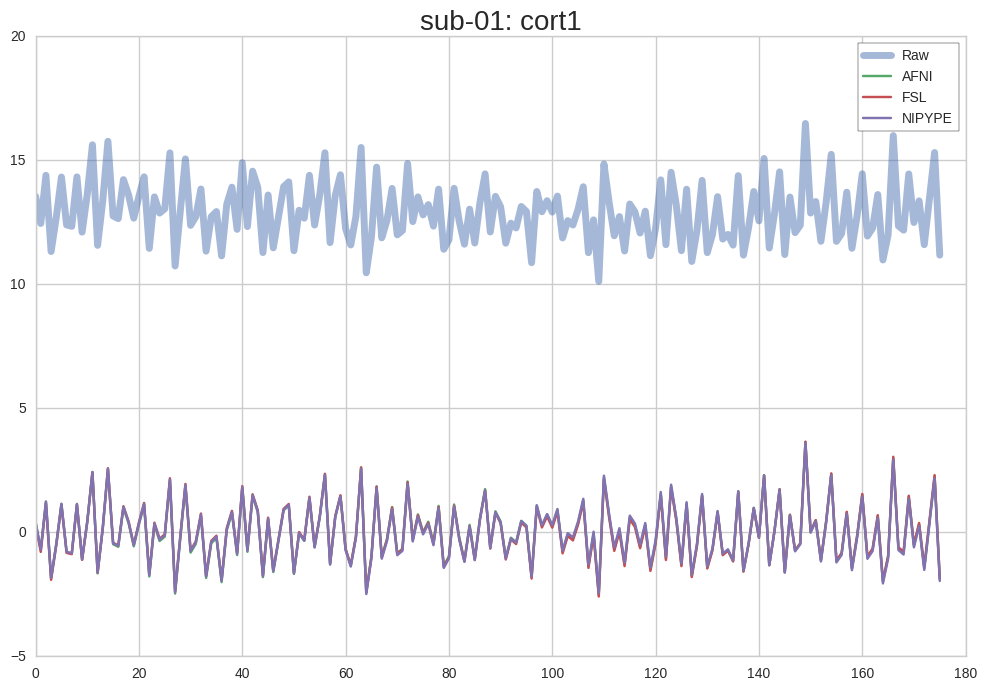

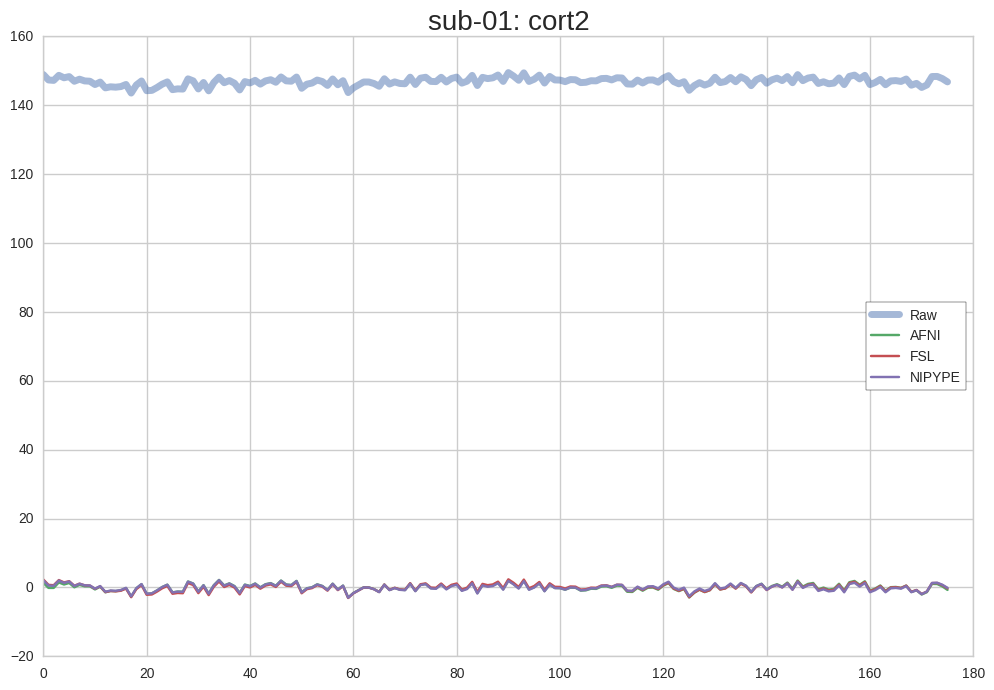

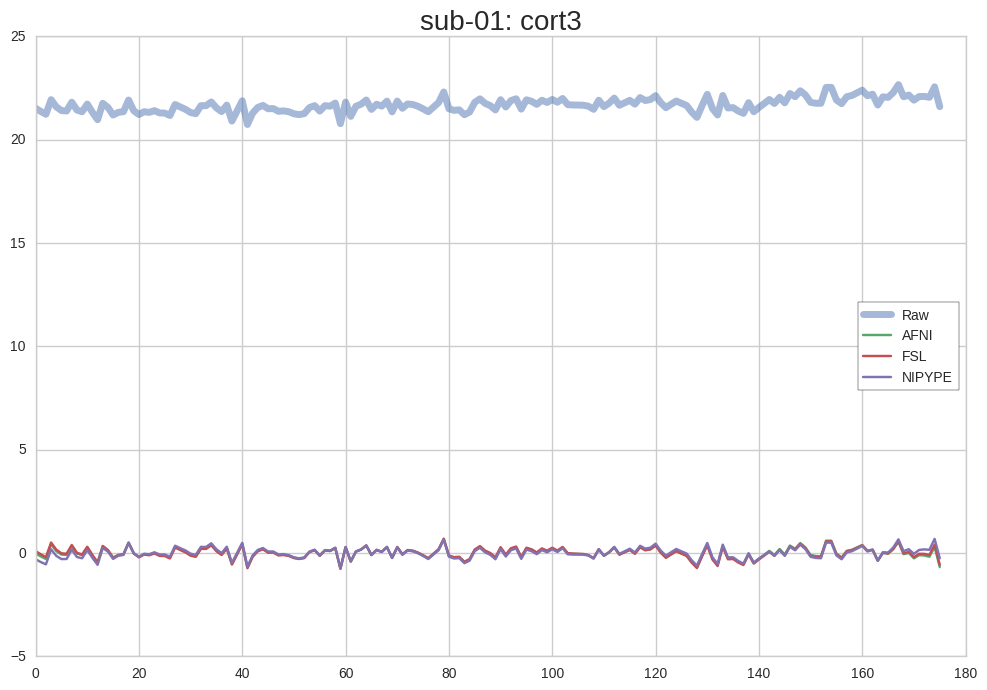

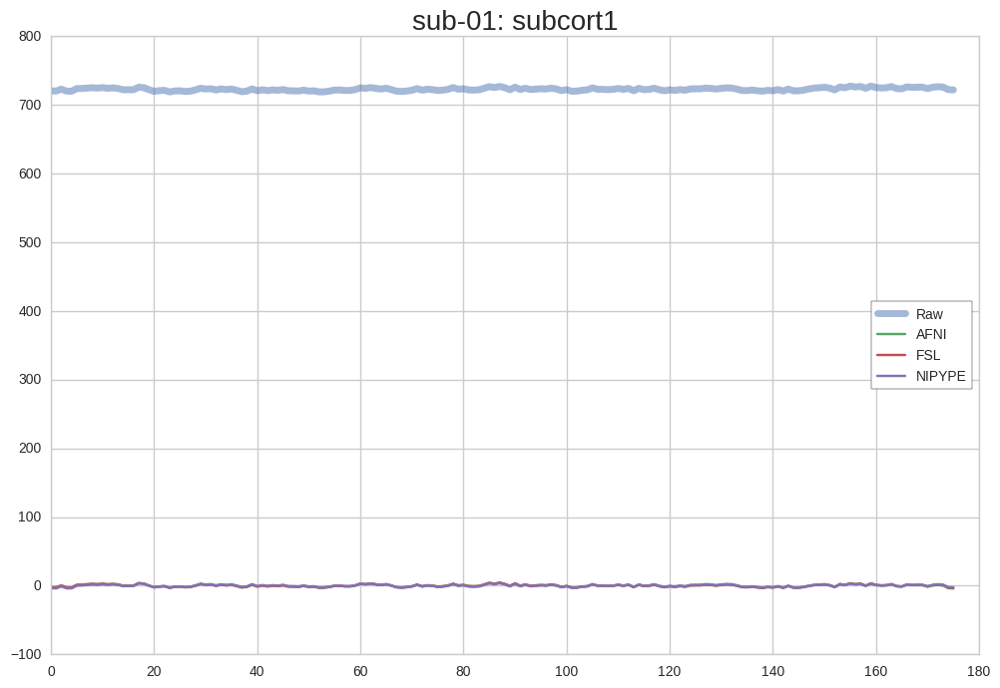

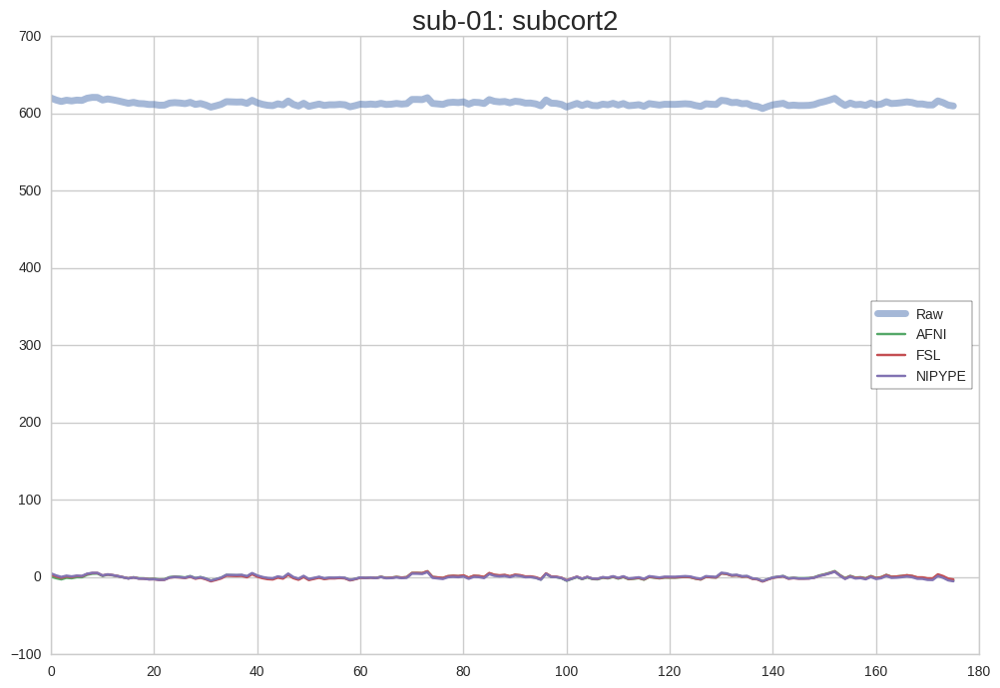

...

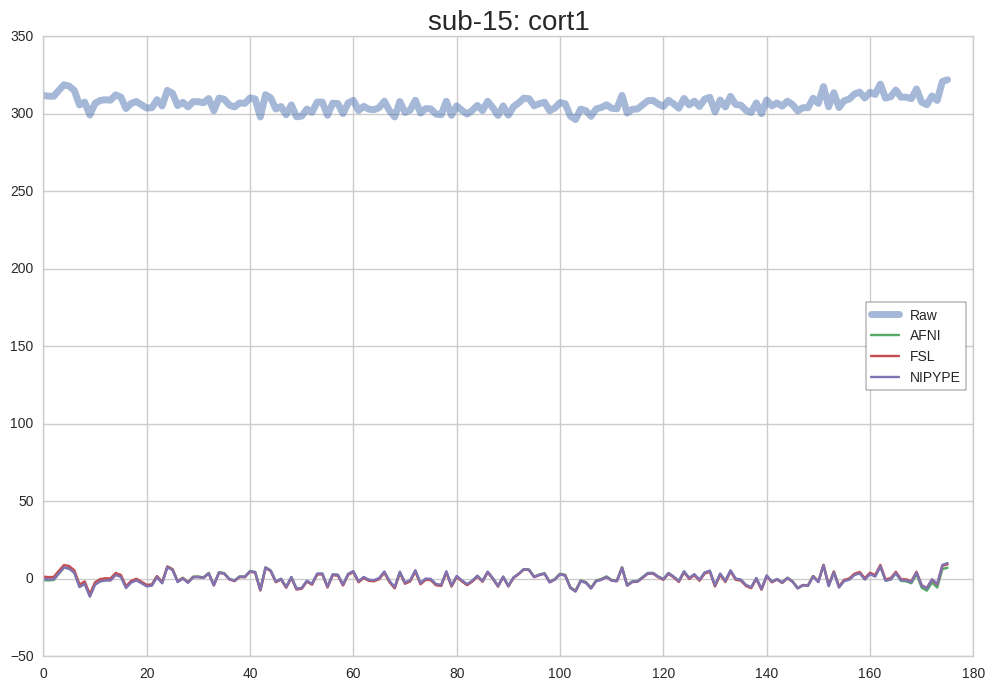

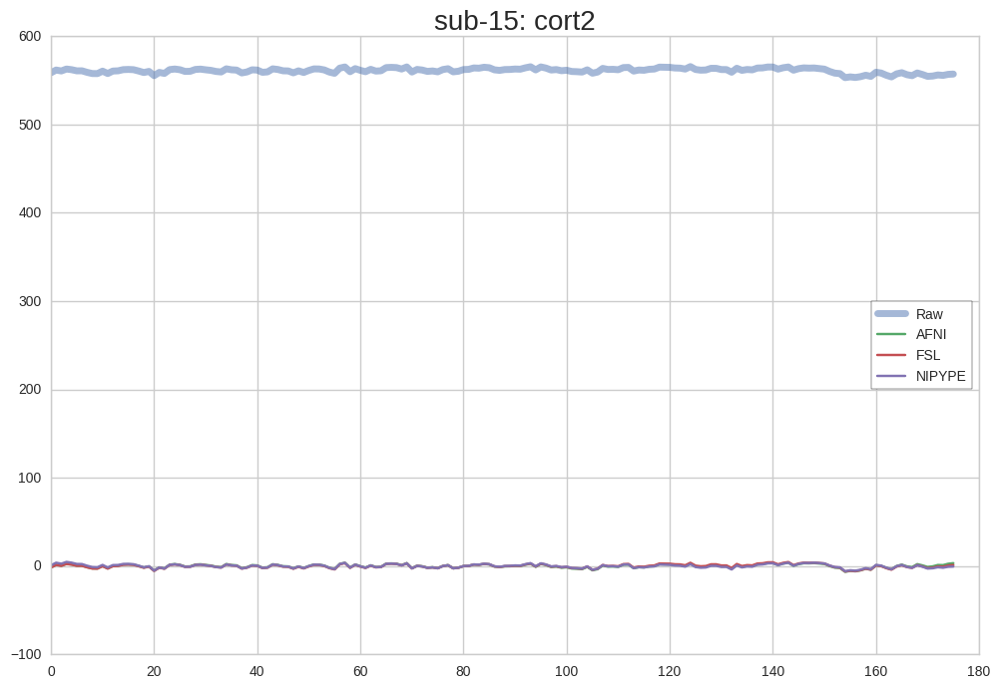

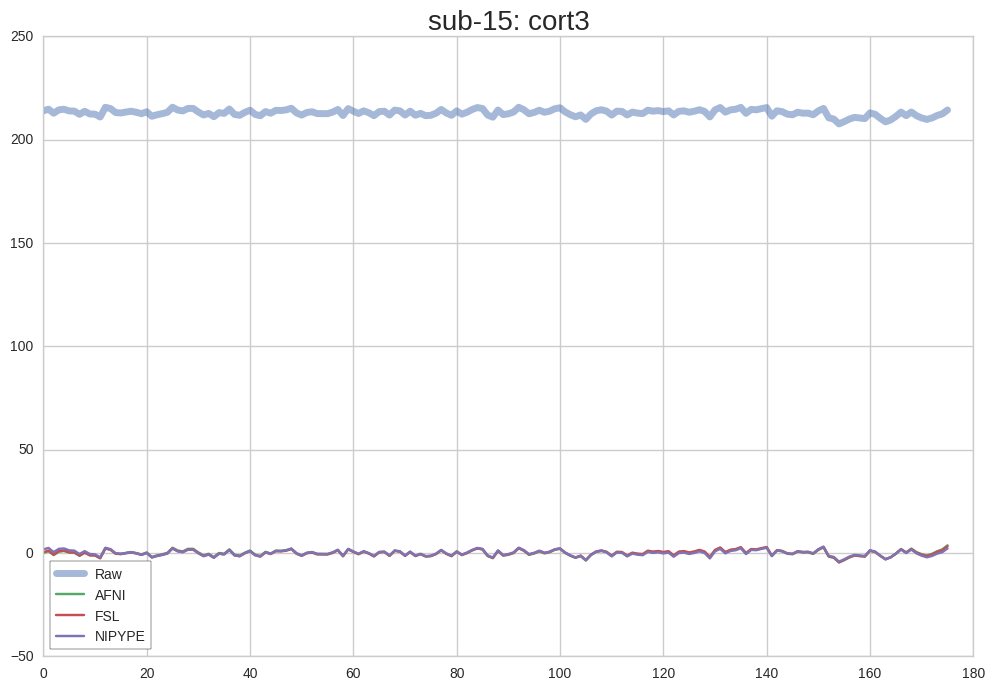

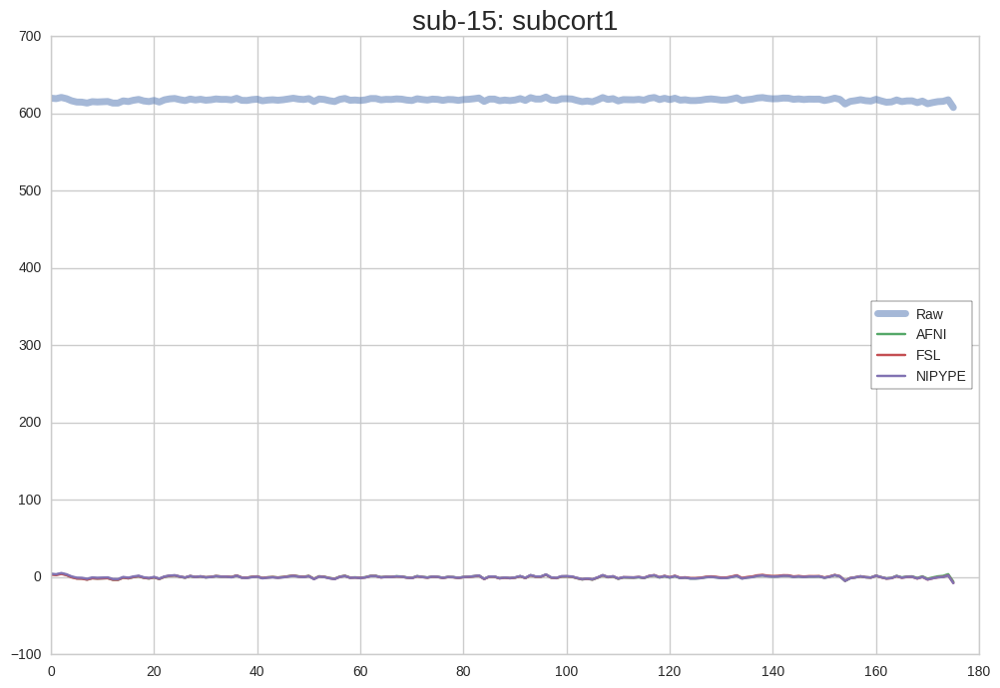

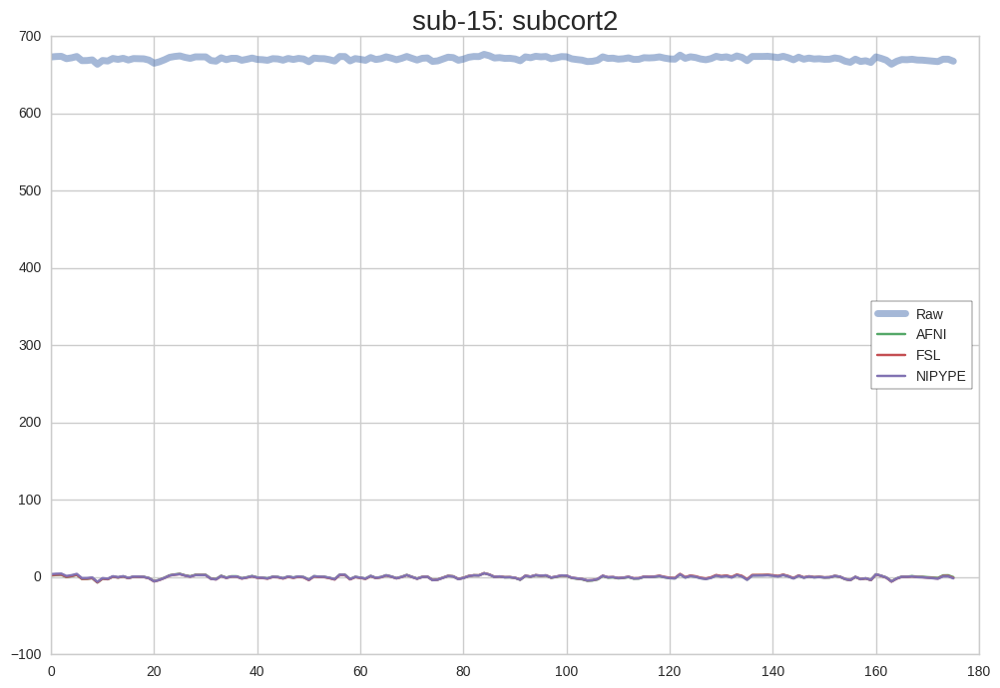

In [4]:
subjects = sorted([basename(f) for f in glob(join(data_dir, 'sub-*'))])
for s in subjects:
    print(s)
    aparc_file = join(surf_dir, s, 'mri/aparc+aseg.mgz')
    sm_dir = join(data_dir, s, 'preproc/func/smoothed/afni_sm3/')
    smbp_dir = join(data_dir, s, 'preproc/func/smoothed_highpassed/')
    sm_files = sorted([basename(f) for f in glob(join(sm_dir, '*.nii.gz'))])
    aparc_img = nib.load(aparc_file)
    orig_mask = aparc_img.get_data()
    
    sm_f = join(sm_dir, sm_files[0])
    n_tps = nib.load(sm_f).shape[-1]
    x = range(n_tps)
    res_aparc_img = resample_to_img(aparc_img, sm_f, interpolation='nearest')
    
    for region in sorted(regions.keys()):
        fig, ax = plt.subplots()
        ax.set_title('{0}: {1}'.format(s, region), fontsize=20)
        aparc_mask = (res_aparc_img.get_data()==regions[region]).astype(int)
        
        # Skip empty masks. Resampling can erase smaller masks.
        if np.sum(aparc_mask) > 0:
            mask_img = nib.Nifti1Image(aparc_mask, res_aparc_img.affine)
            sm_masked_data = apply_mask(sm_f, mask_img)
            ax.plot(x, np.mean(sm_masked_data, axis=1), linewidth=5, alpha=0.5, label='Raw')

            for bp in bp_tools:
                sub_dir = '{0}_bp_afni_sm3'.format(bp)
                smbp_files = sorted([basename(f) for f in glob(join(smbp_dir, sub_dir, '*.nii.gz'))])
                smbp_f = join(smbp_dir, sub_dir, smbp_files[0])
                smbp_masked_data = apply_mask(smbp_f, mask_img)
                ax.plot(x, np.mean(smbp_masked_data, axis=1), label='{0}'.format(bp.upper()))
            legend = ax.legend(frameon=True, loc='best')
            frame = legend.get_frame()
            frame.set_facecolor('white')
            frame.set_edgecolor('black')
            fig.savefig(join(ts_dir, '{0}_{1}.png'.format(s, region)), dpi=100)